# Fase 0 COCO in locale

Notebook per costruire tutta la fase 0 in locale, in modo ordinato e abbastanza scomposto.

Qui faccio tutto il pezzo preparatorio che mi serve prima della pipeline finale:
- controllo file e cartelle;
- leggo le annotazioni COCO;
- scelgo un subset piccolo e gestibile;
- estraggo le maschere dagli `ann_id`;
- salvo `dataset.csv`;
- preparo i file finali per i test;
- lascio pronta la parte TAM sulle 5 immagini scelte.

L'obiettivo qui e'solo evidenziare flusso chiaro.


## Prima di iniziare

Devono esserci:

1. installo le librerie minime del progetto con:

```bash
pip install -r requirements-local.txt
```

2. metto il dataset COCO nelle cartelle giuste:

```text
data/
  annotations/
    instances_val2017.json
  val2017/
    000000000139.jpg
    ...
```

Se qualcosa manca, messaggio esplicito senza che esploda tutto :)


## 1. Struttura del progetto

Albero base da rispettare:

```text
Test COCO/
  data/
    annotations/
      instances_val2017.json
    val2017/
      000000000139.jpg
      ...
  outputs/
  Fase0_COCO_Locale.ipynb
```


In [16]:
from pathlib import Path
import json
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

try:
    from pycocotools.coco import COCO
    from pycocotools import mask as mask_utils
    PYCOCOTOOLS_OK = True
except ImportError:
    PYCOCOTOOLS_OK = False

# Imposto tutti i percorsi principali del progetto una volta sola.
PROJECT_ROOT = Path.cwd()
DATA_DIR = PROJECT_ROOT / 'data'
ANNOTATIONS_DIR = DATA_DIR / 'annotations'
IMAGES_DIR = DATA_DIR / 'val2017'
OUTPUTS_DIR = PROJECT_ROOT / 'outputs'
PHASE0_DIR = OUTPUTS_DIR / 'phase0'
MASKS_DIR = PHASE0_DIR / 'masks'
OVERLAYS_DIR = PHASE0_DIR / 'overlays'
PREVIEWS_DIR = PHASE0_DIR / 'previews'

# Se SHOW_PLOTS = False, il notebook continua a eseguire senza fermarsi
# sulle visualizzazioni intermedie.
SHOW_PLOTS = True

for folder in [OUTPUTS_DIR, PHASE0_DIR, MASKS_DIR, OVERLAYS_DIR, PREVIEWS_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

ANNOTATION_FILE = ANNOTATIONS_DIR / 'instances_val2017.json'

print('Project root:', PROJECT_ROOT)
print('Annotation file:', ANNOTATION_FILE)
print('Image dir:', IMAGES_DIR)
print('pycocotools disponibile:', PYCOCOTOOLS_OK)
print('SHOW_PLOTS:', SHOW_PLOTS)


Project root: C:\Users\loryc\IdeaProjects\Test COCO
Annotation file: C:\Users\loryc\IdeaProjects\Test COCO\data\annotations\instances_val2017.json
Image dir: C:\Users\loryc\IdeaProjects\Test COCO\data\val2017
pycocotools disponibile: True
SHOW_PLOTS: True


## 2. Controllo locale rapido

Qui faccio un controllo veloce per vedere se annotazioni, immagini e librerie principali ci sono davvero.


In [17]:
annotation_exists = ANNOTATION_FILE.exists()
image_count = len(list(IMAGES_DIR.glob('*.jpg'))) if IMAGES_DIR.exists() else 0

print('File annotazioni presente:', annotation_exists)
print('Numero immagini trovate:', image_count)

if not annotation_exists:
    print("Manca 'instances_val2017.json' dentro data/annotations.")
if image_count == 0:
    print("Non ho trovato immagini JPG dentro data/val2017.")
if not PYCOCOTOOLS_OK:
    print("Manca pycocotools: installare prima di usare le celle sulle maschere.")


File annotazioni presente: True
Numero immagini trovate: 5000


## 3. Caricamento annotazioni COCO

Qui carico il file JSON di COCO e mi preparo due dizionari comodi:
- `categories_by_id`: da id numerico a nome categoria;
- `images_by_id`: da id immagine a informazioni sul file.


In [18]:
# Se tutto va bene, qui costruisco l'oggetto COCO e i dizionari base.
coco = None
categories_by_id = {}
images_by_id = {}

if annotation_exists and PYCOCOTOOLS_OK:
    coco = COCO(str(ANNOTATION_FILE))
    categories = coco.loadCats(coco.getCatIds())
    images = coco.dataset.get('images', [])
    categories_by_id = {cat['id']: cat['name'] for cat in categories}
    images_by_id = {img['id']: img for img in images}
    print('Categorie trovate:', len(categories_by_id))
    print('Immagini nel file annotazioni:', len(images_by_id))
else:
    print('Caricamento COCO saltato: controlla file e dipendenze.')


loading annotations into memory...
Done (t=0.29s)
creating index...
index created!
Categorie trovate: 80
Immagini nel file annotazioni: 5000


## 4. Funzioni di supporto

Funzioni base utili:
- conversione annotazione -> maschera binaria;
- overlay semplice tra immagine e maschera;
- salvataggio di preview utili per controllare il risultato.


In [19]:
def annotation_to_mask(coco_obj, ann, height, width):
    """Converte una annotazione COCO in una maschera binaria 0/1."""
    mask = coco_obj.annToMask(ann)
    return (mask > 0).astype(np.uint8)


def load_image(image_path):
    return Image.open(image_path).convert('RGB')


def build_overlay(image, mask, color=(255, 0, 0), alpha=0.35):
    image_np = np.array(image).copy()
    mask_bool = mask.astype(bool)
    color_np = np.array(color, dtype=np.float32)
    image_np[mask_bool] = (
        (1 - alpha) * image_np[mask_bool] + alpha * color_np
    ).astype(np.uint8)
    return Image.fromarray(image_np)


def show_image_mask_overlay(image, mask, title='Preview'):
    overlay = build_overlay(image, mask)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title('Immagine')
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title('Maschera')
    axes[2].imshow(overlay)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    fig.suptitle(title)
    plt.tight_layout()
    if SHOW_PLOTS:
        plt.show()
    else:
        plt.close(fig)


def save_mask_and_overlay(image, mask, stem, obj_name, ann_id=None):
    # Metto ann_id nel nome file cosi' non rischio collisioni tra oggetti simili.
    obj_folder = MASKS_DIR / stem
    obj_folder.mkdir(parents=True, exist_ok=True)
    file_stem = obj_name if ann_id is None else f'{obj_name}_{ann_id}'
    mask_path = obj_folder / f'{file_stem}.png'
    overlay_path = OVERLAYS_DIR / f'{stem}_{file_stem}_overlay.png'

    Image.fromarray((mask * 255).astype(np.uint8)).save(mask_path)
    build_overlay(image, mask).save(overlay_path)
    return mask_path, overlay_path


## 5. Selezione semplice del subset

La consegna chiede 20-30 immagini semplici, con pochi oggetti ben visibili.

Qui faccio una selezione automatica molto semplice:
- prendiamo solo annotazioni non `iscrowd`;
- teniamo immagini con 1 o 2 oggetti abbastanza grandi;
- usiamo l'area dell'annotazione per evitare oggetti troppo piccoli.

Non e' una selezione perfetta, ma come primo filtro va bene. Poi la controllo a mano e tolgo le immagini strane.


In [20]:
# Tengo il subset piccolo cosi' riesco a controllarlo bene a mano.
TARGET_SUBSET_SIZE = 25
MIN_ANN_AREA = 32 * 32

# Qui possiamo escludere manualmente immagini che non ci convincono
# dopo il controllo visivo del subset.
EXCLUDED_IMG_IDS = [6818, 331352] #gabinetto troppo confuso (non avevo capito nemmeno io)

# In candidate_rows salvo tutte le immagini che superano il filtro semplice iniziale.
candidate_rows = []

if coco is not None:
    for image_id, image_info in images_by_id.items():
        if image_id in EXCLUDED_IMG_IDS:
            continue

        ann_ids = coco.getAnnIds(imgIds=[image_id], iscrowd=False)
        anns = coco.loadAnns(ann_ids)

        useful_anns = [ann for ann in anns if ann.get('area', 0) >= MIN_ANN_AREA]
        if len(useful_anns) not in (1, 2):
            continue

        image_path = IMAGES_DIR / image_info['file_name']
        if not image_path.exists():
            continue

        # Ordino per area cosi' il primo oggetto e' quello principale.
        useful_anns = sorted(useful_anns, key=lambda ann: ann.get('area', 0), reverse=True)
        useful_categories = [ann['category_id'] for ann in useful_anns]
        if len(useful_categories) != len(set(useful_categories)):
            continue

        row = {
            'img_id': image_id,
            'path': str(image_path),
        }

        if useful_anns:
            main_ann = useful_anns[0]
            row['obj_main'] = categories_by_id.get(main_ann['category_id'], f"cat_{main_ann['category_id']}")
            row['ann_id_main'] = main_ann['id']

        for idx, ann in enumerate(useful_anns, start=1):
            category_name = categories_by_id.get(ann['category_id'], f"cat_{ann['category_id']}")
            row[f'obj_{idx}'] = category_name
            row[f'ann_id_{idx}'] = ann['id']

        candidate_rows.append(row)

candidate_df = pd.DataFrame(candidate_rows)
subset_df = candidate_df.head(TARGET_SUBSET_SIZE).copy()

for col in ['img_id', 'ann_id_main', 'ann_id_1', 'ann_id_2']:
    if col in subset_df.columns:
        subset_df[col] = subset_df[col].astype('Int64')

print('Immagini candidate trovate:', len(candidate_df))
print('Immagini escluse a mano:', EXCLUDED_IMG_IDS)
print('Immagini nel subset scelto:', len(subset_df))
subset_df.head(10)


Immagini candidate trovate: 1738
Immagini escluse a mano: [6818, 331352]
Immagini nel subset scelto: 25


,img_id,path,obj_main,ann_id_main,obj_1,ann_id_1,obj_2,ann_id_2
0,403385,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,toilet,1096418,toilet,1096418,sink,1131709
1,348881,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,airplane,247475,airplane,247475,person,185744
2,522713,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,bench,571702,bench,571702,NaN,<NA>
3,143931,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,bus,168219,bus,168219,person,2155619
4,303818,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,bus,365995,bus,365995,car,1191953
5,184321,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,train,171481,train,171481,NaN,<NA>
6,565778,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,train,174719,train,174719,person,224745
7,297343,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,stop sign,270208,stop sign,270208,NaN,<NA>
8,336587,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,stop sign,270138,stop sign,270138,truck,1796885
9,122745,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,stop sign,271021,stop sign,271021,NaN,<NA>


## 6. Revisione visiva del subset

Qui guardo il subset per capire se le immagini scelte hanno davvero senso.

Questa sezione serve per controllare se:
- gli oggetti principali sono davvero ben visibili;
- la scena e' abbastanza semplice;
- il subset automatico e' coerente con la consegna.

Si decide cosa escludere.


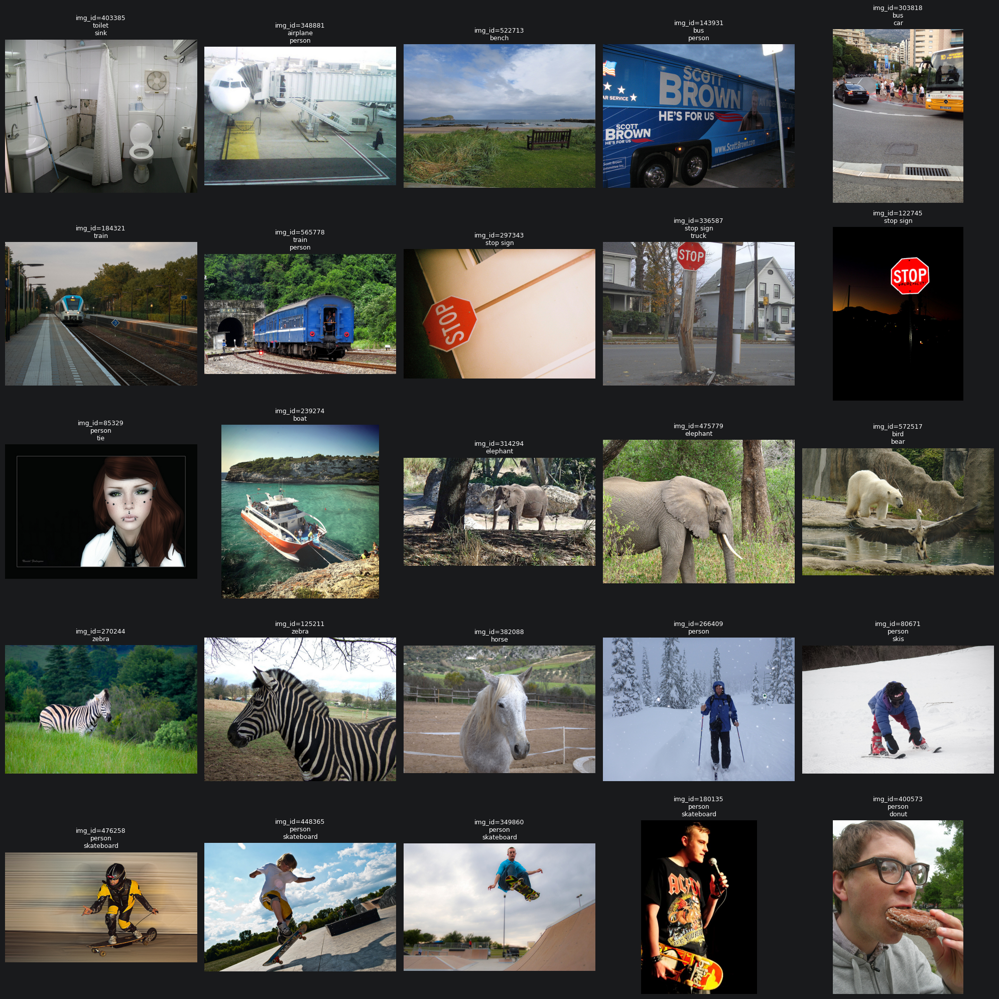

In [21]:
def show_subset_gallery(subset, max_images=25, cols=5):
    # Griglia per controllo visivo del subset.
    if len(subset) == 0:
        print('Subset vuoto: non c\'e nulla da mostrare.')
        return

    subset_to_show = subset.head(max_images)
    rows = math.ceil(len(subset_to_show) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(rows, cols)

    for ax in axes.flat:
        ax.axis('off')

    for idx, (_, row) in enumerate(subset_to_show.iterrows()):
        ax = axes.flat[idx]
        image = load_image(Path(row['path']))
        ax.imshow(image)
        title_parts = [f"img_id={row['img_id']}", str(row.get('obj_1', ''))]
        if pd.notna(row.get('obj_2')):
            title_parts.append(str(row.get('obj_2')))
        ax.set_title('\n'.join(title_parts), fontsize=9)
        ax.axis('off')

    plt.tight_layout()
    if SHOW_PLOTS:
        plt.show()
    else:
        plt.close(fig)


show_subset_gallery(subset_df, max_images=25, cols=5)


## 7. Salvataggio di `dataset.csv`

Qui salvo il dataset di lavoro vero e proprio.

Nota: il formato richiesto nella consegna e' del tipo:
- `img_id`
- `path`
- `obj_main`, `ann_id_main`
- `obj_1`, `ann_id_1`
- `obj_2`, `ann_id_2`
- ...


In [22]:
dataset_csv_path = PHASE0_DIR / 'dataset.csv'

if len(subset_df) > 0:
    subset_df.to_csv(dataset_csv_path, index=False)
    print('Salvato:', dataset_csv_path)
else:
    print('dataset.csv non creato: il subset e\' vuoto.')


Salvato: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\dataset.csv


## 8. Estrazione maschere e controllo visivo

Controllo se la ground truth e' giusta.

Per alcune immagini del subset:
- leggiamo l'immagine;
- prendiamo l'annotazione usando `ann_id`;
- convertiamo la segmentazione in maschera binaria;
- mostriamo immagine, maschera e overlay;
- salviamo i file dentro `outputs/phase0/`.


img_id=403385 | oggetto=toilet
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000403385\toilet_1096418.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000403385_toilet_1096418_overlay.png


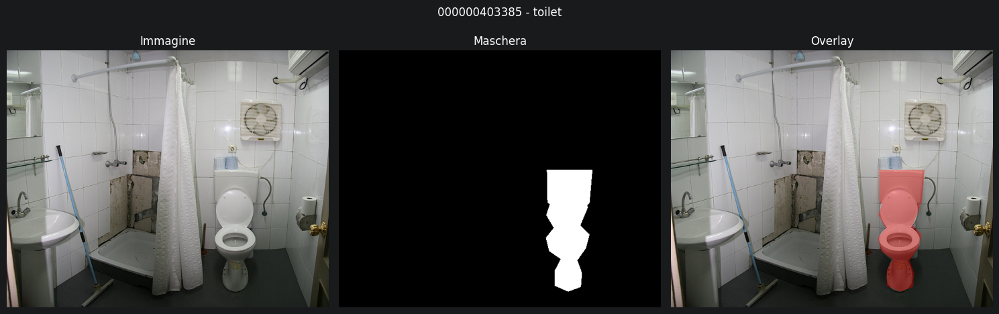

img_id=403385 | oggetto=sink
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000403385\sink_1131709.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000403385_sink_1131709_overlay.png


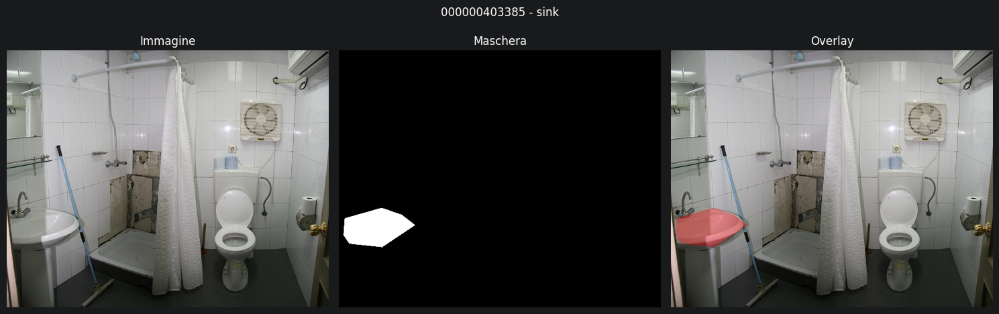

img_id=348881 | oggetto=airplane
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000348881\airplane_247475.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000348881_airplane_247475_overlay.png


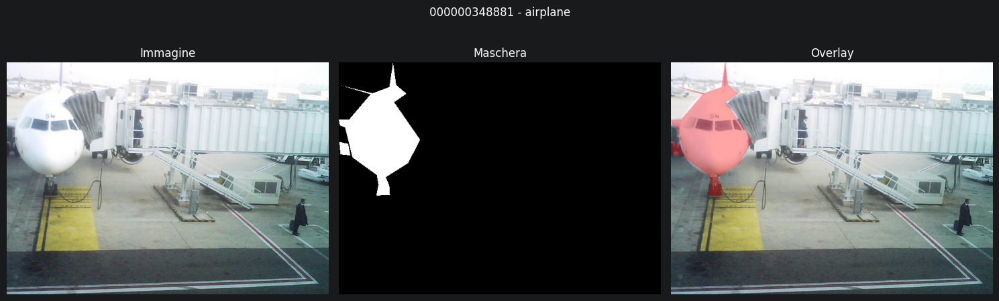

img_id=348881 | oggetto=person
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000348881\person_185744.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000348881_person_185744_overlay.png


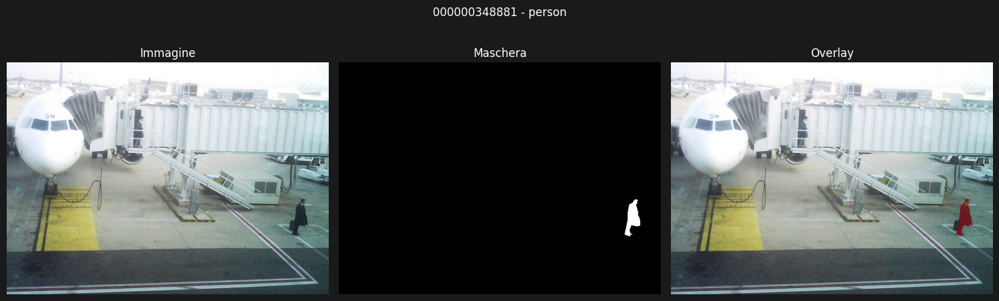

img_id=522713 | oggetto=bench
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000522713\bench_571702.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000522713_bench_571702_overlay.png


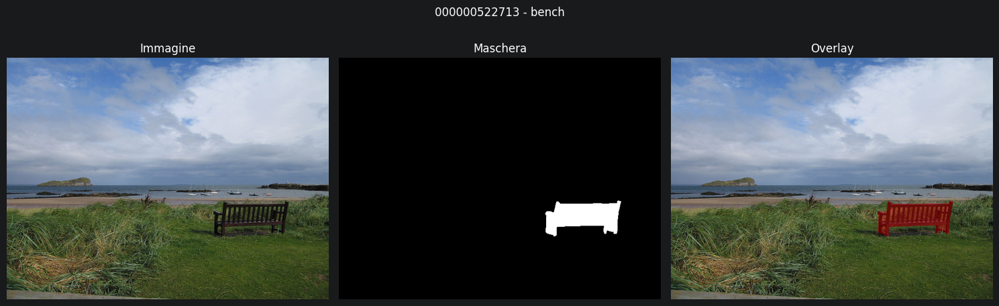

img_id=143931 | oggetto=bus
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000143931\bus_168219.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000143931_bus_168219_overlay.png


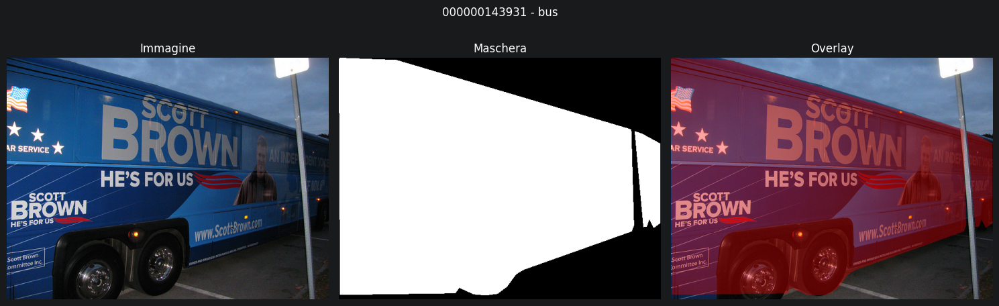

img_id=143931 | oggetto=person
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000143931\person_2155619.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000143931_person_2155619_overlay.png


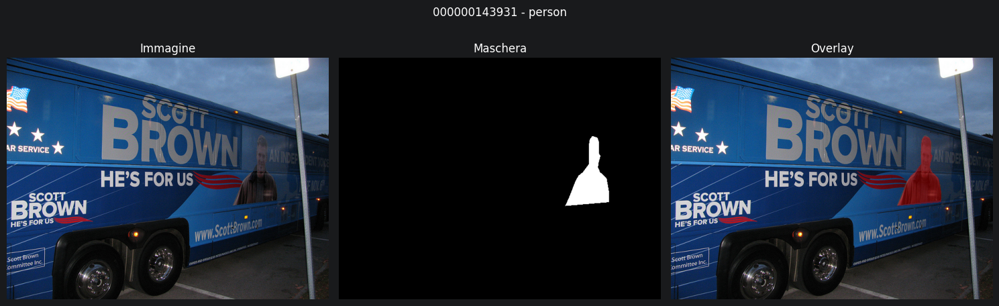

img_id=303818 | oggetto=bus
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000303818\bus_365995.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000303818_bus_365995_overlay.png


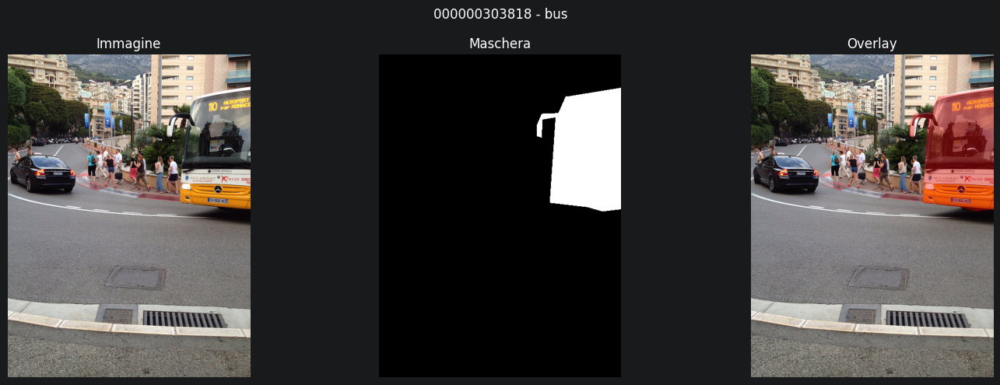

img_id=303818 | oggetto=car
mask: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\masks\000000303818\car_1191953.png
overlay: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\overlays\000000303818_car_1191953_overlay.png


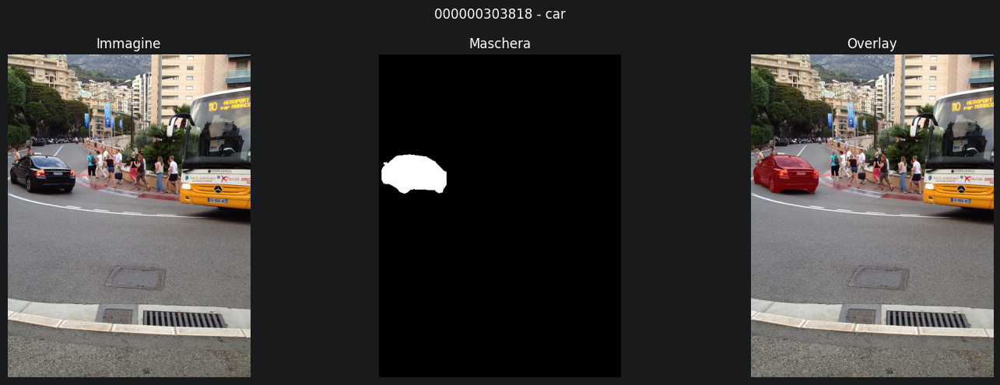

In [23]:
# Qui faccio vedere e salvo solo qualche esempio, non tutto il subset.
PREVIEW_IMAGES = 5

if coco is not None and len(subset_df) > 0:
    preview_df = subset_df.head(PREVIEW_IMAGES)

    for _, row in preview_df.iterrows():
        image_path = Path(row['path'])
        image = load_image(image_path)
        image_info = images_by_id[row['img_id']]
        height = image_info['height']
        width = image_info['width']
        stem = image_path.stem

        for obj_idx in [1, 2]:
            ann_col = f'ann_id_{obj_idx}'
            obj_col = f'obj_{obj_idx}'
            if ann_col not in row or pd.isna(row.get(ann_col)):
                continue

            ann = coco.loadAnns([int(row[ann_col])])[0]
            obj_name = str(row[obj_col])
            mask = annotation_to_mask(coco, ann, height, width)
            ann_id = int(row[ann_col])
            mask_path, overlay_path = save_mask_and_overlay(image, mask, stem, obj_name, ann_id=ann_id)

            print(f'img_id={row["img_id"]} | oggetto={obj_name}')
            print('mask:', mask_path)
            print('overlay:', overlay_path)
            show_image_mask_overlay(image, mask, title=f'{stem} - {obj_name}')
else:
    print('Questa cella richiede subset pronto, annotazioni presenti e pycocotools installato.')


## 9. Base per `results_phase0.csv`

La consegna chiede un file finale con queste colonne:
- `img_id`
- `prompt`
- `output`
- `target_token`
- `obj_iou`
- `func_iou`
- `f1_iou`

Per ora basta creare il file con le colonne giuste, cosi' la struttura finale e' gia' pronta.


In [24]:
# Preparo il file finale con le colonne richieste dalla consegna.
results_columns = [
    'img_id',
    'prompt',
    'output',
    'target_token',
    'obj_iou',
    'func_iou',
    'f1_iou',
]

results_phase0_path = PHASE0_DIR / 'results_phase0.csv'
results_df = pd.DataFrame(columns=results_columns)
results_df.to_csv(results_phase0_path, index=False)
print('Creato file base:', results_phase0_path)
results_df.head()


Creato file base: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\results_phase0.csv


,img_id,prompt,output,target_token,obj_iou,func_iou,f1_iou


## 10. Preparazione minima per la parte TAM

Qui non eseguo ancora TAM.
Qui mi preparo solo la base che poi usero' nel run finale.

Per ogni immagine test devo avere almeno:
- un prompt semplice;
- l'output generato dal modello;
- un token target sensato, meglio se corrisponde a un oggetto visibile;
- la heatmap TAM per quel token;
- il confronto con la maschera COCO per ottenere le metriche.

Qui sotto creo una tabella guida da aggiornare dopo il run del modello.


In [25]:
# Queste sono le 5 immagini finali che tengo per i test veri.
FINAL_TEST_IMG_IDS = [522713, 572517, 448365, 400573, 403385]

# Estraggo dal subset grande solo le 5 immagini finali.
selected_test_df = subset_df[subset_df['img_id'].isin(FINAL_TEST_IMG_IDS)].copy()
# Mantengo l'ordine deciso a mano e non quello casuale del dataframe.
selected_test_df['test_order'] = selected_test_df['img_id'].apply(lambda x: FINAL_TEST_IMG_IDS.index(x))
selected_test_df = selected_test_df.sort_values('test_order').drop(columns=['test_order'])

missing_test_ids = [img_id for img_id in FINAL_TEST_IMG_IDS if img_id not in set(selected_test_df['img_id'].tolist())]
if missing_test_ids:
    print('Attenzione: mancano queste img_id nel subset finale:', missing_test_ids)

# Qui costruisco una tabella piccola e leggibile solo per le 5 immagini finali.
tam_plan_rows = []

for _, row in selected_test_df.iterrows():
    tam_plan_rows.append({
        'img_id': row['img_id'],
        'path': row['path'],
        'prompt_suggerito': 'What is the main object in the image? Answer with one word only.',
        'oggetto_principale': row.get('obj_main', row.get('obj_1', '')),
        'ann_id_principale': row.get('ann_id_main', row.get('ann_id_1', '')),
        'target_token_atteso': row.get('obj_main', row.get('obj_1', '')),
        'note': 'Scelta implementativa locale: prompt semplice per ottenere un token target chiaro. Il paper usa un prompt di captioning.',
    })

tam_plan_df = pd.DataFrame(tam_plan_rows)
tam_plan_path = PHASE0_DIR / 'selected_test_images.csv'
tam_plan_df.to_csv(tam_plan_path, index=False)
print('Salvato:', tam_plan_path)
tam_plan_df


Salvato: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\selected_test_images.csv


,img_id,path,prompt_suggerito,oggetto_principale,ann_id_principale,target_token_atteso,note
0,522713,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,bench,571702,bench,Scelta implementativa locale: prompt semplice ...
1,572517,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,bird,37181,bird,Scelta implementativa locale: prompt semplice ...
2,448365,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,person,439433,person,Scelta implementativa locale: prompt semplice ...
3,400573,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,person,442987,person,Scelta implementativa locale: prompt semplice ...
4,403385,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,toilet,1096418,toilet,Scelta implementativa locale: prompt semplice ...


## 11. Revisione delle 5 immagini finali

Da qui in poi lavoro solo sulle 5 immagini finali.

Qui faccio due cose:
- mostriamo le 5 immagini finali;
- prepariamo una tabella con prompt semplici e target token attesi.

Il prompt qui resta semplice.
Per il run locale mi interessa ottenere un token target chiaro e gestibile.


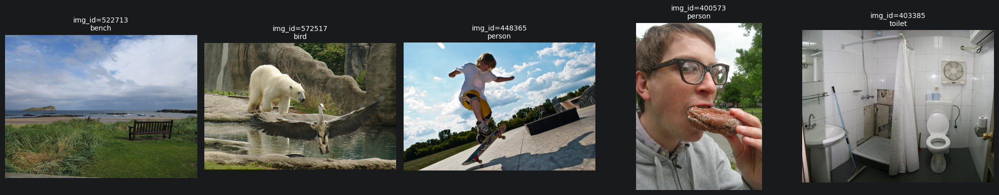

Salvato: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\final_test_prompts.csv


,img_id,path,prompt_finale,target_token_atteso,ann_id_principale,oggetto_principale,nota
0,522713,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,bench,571702,bench,Prompt semplice scelto per il run locale. Il p...
1,572517,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,bird,37181,bird,Prompt semplice scelto per il run locale. Il p...
2,448365,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,person,439433,person,Prompt semplice scelto per il run locale. Il p...
3,400573,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,person,442987,person,Prompt semplice scelto per il run locale. Il p...
4,403385,C:\Users\loryc\IdeaProjects\Test COCO\data\val...,What is the main object in the image? Answer w...,toilet,1096418,toilet,Prompt semplice scelto per il run locale. Il p...


In [26]:
def show_final_test_gallery(test_df, cols=5):
    # Questa galleria mi serve per ricontrollare solo le 5 immagini finali.
    if len(test_df) == 0:
        print('Nessuna immagine finale da mostrare.')
        return

    rows = math.ceil(len(test_df) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(rows, cols)

    for ax in axes.flat:
        ax.axis('off')

    for idx, (_, row) in enumerate(test_df.iterrows()):
        ax = axes.flat[idx]
        image = load_image(Path(row['path']))
        ax.imshow(image)
        ax.set_title(f"img_id={row['img_id']}\n{row['oggetto_principale']}", fontsize=10)
        ax.axis('off')

    plt.tight_layout()
    if SHOW_PLOTS:
        plt.show()
    else:
        plt.close(fig)


show_final_test_gallery(tam_plan_df, cols=5)

# Qui trasformo la tabella delle 5 immagini in una tabella prompt -> target atteso.
final_prompt_rows = []
for _, row in tam_plan_df.iterrows():
    final_prompt_rows.append({
        'img_id': row['img_id'],
        'path': row['path'],
        'prompt_finale': 'What is the main object in the image? Answer with one word only.',
        'target_token_atteso': row['target_token_atteso'],
        'ann_id_principale': row['ann_id_principale'],
        'oggetto_principale': row['oggetto_principale'],
        'nota': 'Prompt semplice scelto per il run locale. Il paper usa una caption completa: "Write a one-sentence caption for this image:".',
    })

final_prompt_df = pd.DataFrame(final_prompt_rows)
final_prompt_path = PHASE0_DIR / 'final_test_prompts.csv'
final_prompt_df.to_csv(final_prompt_path, index=False)
print('Salvato:', final_prompt_path)
final_prompt_df


## 12. Maschere finali per le 5 immagini di test

Qui fisso la ground truth finale delle 5 immagini test.

Questo e' il riferimento che poi uso per il confronto con la heatmap TAM.

Per ogni immagine salvo:
- la maschera del target principale;
- l'overlay relativo;
- il percorso dei file, cosi' resta tutto tracciato.


In [27]:
# Qui salvo in modo esplicito la ground truth finale delle 5 immagini test.
final_mask_rows = []

for _, row in tam_plan_df.iterrows():
    image_path = Path(row['path'])
    image = load_image(image_path)
    stem = image_path.stem
    ann_id = int(row['ann_id_principale'])
    # Recupero l'annotazione corretta e la trasformo in maschera binaria.
    ann = coco.loadAnns([ann_id])[0]
    image_info = images_by_id[int(row['img_id'])]
    mask = annotation_to_mask(coco, ann, image_info['height'], image_info['width'])
    mask_path, overlay_path = save_mask_and_overlay(
        image,
        mask,
        stem,
        row['oggetto_principale'],
        ann_id=ann_id,
    )

    final_mask_rows.append({
        'img_id': int(row['img_id']),
        'ann_id_principale': ann_id,
        'oggetto_principale': row['oggetto_principale'],
        'mask_path': str(mask_path),
        'overlay_path': str(overlay_path),
    })

final_masks_df = pd.DataFrame(final_mask_rows)
final_masks_path = PHASE0_DIR / 'final_test_masks.csv'
final_masks_df.to_csv(final_masks_path, index=False)
print('Salvato:', final_masks_path)
final_masks_df


Salvato: C:\Users\loryc\IdeaProjects\Test COCO\outputs\phase0\final_test_masks.csv


,img_id,ann_id_principale,oggetto_principale,mask_path,overlay_path
0,522713,571702,bench,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...
1,572517,37181,bird,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...
2,448365,439433,person,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...
3,400573,442987,person,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...
4,403385,1096418,toilet,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...,C:\Users\loryc\IdeaProjects\Test COCO\outputs\...


## 13. Tabella operativa per i test finali

Qui metto insieme in un solo punto tutto quello che mi serve per il run finale.

Per ogni immagine tengo insieme:
- prompt finale;
- target token atteso;
- ann_id principale;
- percorso della maschera;
- colonne vuote da compilare dopo la generazione del modello.

Cosi' dopo aggiorno tutto da una tabella sola.


In [ ]:
# Qui unisco prompt, maschere e colonne finali che poi usero' nel run del modello.
final_work_df = final_prompt_df.merge(final_masks_df, on=['img_id', 'ann_id_principale', 'oggetto_principale'], how='left')

# Queste colonne per ora restano vuote: le riempiro' dopo il run TAM.
final_work_df['output_modello'] = ''
final_work_df['target_token_scelto'] = final_work_df['target_token_atteso']
final_work_df['heatmap_path'] = ''
final_work_df['obj_iou'] = np.nan
final_work_df['func_iou'] = np.nan
final_work_df['f1_iou'] = np.nan

final_work_path = PHASE0_DIR / 'final_test_worktable.csv'
final_work_df.to_csv(final_work_path, index=False)
print('Salvato:', final_work_path)
final_work_df


## 14. Struttura pratica dei test sulle 5 immagini

Qui mi preparo il flusso finale dei test sulle 5 immagini.
La struttura da qui in poi resta questa.

Qui devo poter annotare:
- output del modello;
- token target scelto davvero;
- percorso della heatmap salvata;
- metriche finali.

Quando collego la pipeline TAM aggiorno solo questa tabella.


In [ ]:
# Questa e' la tabella pratica che poi aggiorno dopo il run TAM.
test_run_df = final_work_df.copy()

# Per adesso lasciamo colonne vuote o precompilate con valori di base.
# Nella fase TAM queste colonne verranno aggiornate con i risultati veri.
test_run_df['output_modello'] = test_run_df['output_modello'].fillna('')
test_run_df['target_token_scelto'] = test_run_df['target_token_scelto'].fillna(test_run_df['target_token_atteso'])
test_run_df['heatmap_path'] = test_run_df['heatmap_path'].fillna('')

# Questa preview mostra solo le colonne piu' utili da controllare a colpo d'occhio.
test_run_preview = test_run_df[[
    'img_id',
    'prompt_finale',
    'oggetto_principale',
    'target_token_atteso',
    'target_token_scelto',
    'mask_path',
    'output_modello',
    'heatmap_path',
    'obj_iou',
    'func_iou',
    'f1_iou',
]]

test_run_path = PHASE0_DIR / 'test_run_table.csv'
test_run_df.to_csv(test_run_path, index=False)
print('Salvato:', test_run_path)
test_run_preview


### Come usero' questa tabella dopo

Quando passo alla parte TAM, per ogni riga faccio questi passaggi:

1. passare l'immagine e il prompt al modello;
2. salvare `output_modello`;
3. scegliere il `target_token_scelto` tra i token generati;
4. generare e salvare la heatmap in `heatmap_path`;
5. confrontare la heatmap con `mask_path`;
6. scrivere `obj_iou`, `func_iou`, `f1_iou`.

Cosi' il flusso resta lineare e coerente con la fase 0.
